In [1]:
import os
import sys
import json
import argparse

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import nibabel as nib

from glob import glob
from nilearn.glm.second_level import SecondLevelModel
from nilearn.glm.second_level import make_second_level_design_matrix
from nilearn.image import threshold_img
from nilearn.glm import threshold_stats_img

/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/glm/__init__.py:55: FutureWarning: The nilearn.glm module is experimental. It may change in any future release of Nilearn.
  warn('The nilearn.glm module is experimental. '


In [2]:
from nilearn import plotting, datasets, surface

# for plotting slices
mni152_template = datasets.load_mni152_template(resolution=1)
# for plotting on surface
fsaverage = datasets.fetch_surf_fsaverage('fsaverage')

In [48]:
task_label = 'tonecat'
contrast_label = 'sound'
fwhm = 4.5
space_label = 'MNI152NLin2009cAsym'

# define data directories
bidsroot = os.path.join('/bgfs/bchandrasekaran/krs228/data/', 
                        'FLT/','data_bids')
nilearn_dir = os.path.join(bidsroot, 'derivatives', 'nilearn')

# define first-level directory where group-level inputs will be pulled from
l1_dir = os.path.join(nilearn_dir, 'level-1_fwhm-%.02f'%fwhm)

# create output directory
group_out_dir = os.path.join(nilearn_dir, 'group_fwhm-%.02f'%fwhm)
if not os.path.exists(group_out_dir):
        os.makedirs(group_out_dir)

# Second-level analyses

Based on [nilearn documentation](https://nilearn.github.io/stable/auto_examples/05_glm_second_level/plot_thresholding.html#statistical-testing-of-a-second-level-analysis)

### Build the group-level design matrix

#### Read the `participants.tsv` file from the BIDS root directory

In [4]:
participants_fpath = os.path.join(bidsroot, 'participants.tsv')
participants_df = pd.read_csv(participants_fpath, sep='\t')

# subjects to ignore (not fully processed, etc.)
ignore_subs = [ ]
participants_df.drop(participants_df[participants_df.participant_id.isin(ignore_subs)].index, inplace=True)

# re-sort by participant ID
participants_df.sort_values(by=['participant_id'], ignore_index=True, inplace=True)

In [5]:
print(participants_df)

   participant_id  age sex         group
0       sub-FLT02   21   F  non-Mandarin
1       sub-FLT03   25   F      Mandarin
2       sub-FLT04   21   F  non-Mandarin
3       sub-FLT05   26   M      Mandarin
4       sub-FLT06   21   F  non-Mandarin
5       sub-FLT07   22   M      Mandarin
6       sub-FLT08   23   F      Mandarin
7       sub-FLT09   30   F  non-Mandarin
8       sub-FLT10   23   F      Mandarin
9       sub-FLT11   20   F  non-Mandarin
10      sub-FLT12   20   F  non-Mandarin
11      sub-FLT13   23   F  non-Mandarin
12      sub-FLT14   23   M  non-Mandarin
13      sub-FLT15   22   M      Mandarin
14      sub-FLT17   29   F      Mandarin
15      sub-FLT18   24   M      Mandarin
16      sub-FLT19   24   M      Mandarin
17      sub-FLT20   26   F  non-Mandarin
18      sub-FLT21   21   M      Mandarin
19      sub-FLT22   41   F      Mandarin
20      sub-FLT23   26   F      Mandarin
21      sub-FLT24   20   M      Mandarin
22      sub-FLT25   19   F  non-Mandarin
23      sub-FLT2

In [6]:
# create group-specific lists of subject IDs
sub_list_mand = list(participants_df.participant_id[participants_df.group=='Mandarin'])
sub_list_nman = list(participants_df.participant_id[participants_df.group=='non-Mandarin'])

In [7]:
print(sub_list_mand)

['sub-FLT03', 'sub-FLT05', 'sub-FLT07', 'sub-FLT08', 'sub-FLT10', 'sub-FLT15', 'sub-FLT17', 'sub-FLT18', 'sub-FLT19', 'sub-FLT21', 'sub-FLT22', 'sub-FLT23', 'sub-FLT24', 'sub-FLT26']


In [8]:
print(sub_list_nman)

['sub-FLT02', 'sub-FLT04', 'sub-FLT06', 'sub-FLT09', 'sub-FLT11', 'sub-FLT12', 'sub-FLT13', 'sub-FLT14', 'sub-FLT20', 'sub-FLT25']


#### Create design matrixes

In [9]:
# get participant IDs and their group labels
subjects_label = list(participants_df.participant_id)
groups_label = list(participants_df.group)

# make new dataframe from the group labels
design_mat_groupdiff = pd.DataFrame({'Mand': groups_label,
                                     'NMan': groups_label,
                                    }
                                   )
# convert to 1s and 0s for each group as appropriate
design_mat_groupdiff['Mand'].loc[design_mat_groupdiff['Mand'] == 'Mandarin'] = 1
design_mat_groupdiff['Mand'].loc[design_mat_groupdiff['Mand'] == 'non-Mandarin'] = 0
design_mat_groupdiff['NMan'].loc[design_mat_groupdiff['NMan'] == 'Mandarin'] = 0
design_mat_groupdiff['NMan'].loc[design_mat_groupdiff['NMan'] == 'non-Mandarin'] = 1
design_mat_groupdiff = design_mat_groupdiff.astype('int')
print(design_mat_groupdiff)

    Mand  NMan
0      0     1
1      1     0
2      0     1
3      1     0
4      0     1
5      1     0
6      1     0
7      0     1
8      1     0
9      0     1
10     0     1
11     0     1
12     0     1
13     1     0
14     1     0
15     1     0
16     1     0
17     0     1
18     1     0
19     1     0
20     1     0
21     1     0
22     0     1
23     1     0


### Get files

In [11]:
# get the beta map for the contrast of interest for each subject
l1_fnames_groupdiff = [sorted(glob(l1_dir+'/%s_space-%s/run-all/*%s_map-beta.nii.gz'%(sub_id, space_label, contrast_label)))[0] for sub_id in subjects_label]

In [12]:
len(l1_fnames_groupdiff)

24

### Mandarin-speaking group:

#### Using combined GLM, with contrast isolating Mandarin group

In [50]:
# create a model object
second_level_model = SecondLevelModel().fit(l1_fnames_groupdiff, design_matrix=design_mat_groupdiff)

# fit the model with our contrast of interest
z_map = second_level_model.compute_contrast(second_level_contrast=[1, 0,], output_type='z_score')

In [51]:
# threshold the second-level stats image
alpha = 0.05
cthresh = 10
cluster_correct = 'fdr'

thresholded_map, zthresh = threshold_stats_img(
                            z_map,
                            alpha=alpha,
                            height_control=cluster_correct,
                            cluster_threshold=cthresh,
                            two_sided=True,
                        )

In [52]:
z_fpath   = os.path.join(group_out_dir,
                         'group-Mand_space-{}_contrast-{}_map-zstat.nii.gz'.format(space_label, contrast_label))
thr_fpath = os.path.join(group_out_dir,
                         'group-Mand_space-{}_contrast-{}_alpha-{}_correct-{}_cthresh-{}_map-zstat.nii.gz'.format(space_label, contrast_label, alpha, cluster_correct, cthresh))

nib.save(z_map, z_fpath)
nib.save(thresholded_map, thr_fpath)

In [15]:
plot_title = ('Mandarin-speaking group (n=%d)\n'
              '%s > baseline FDR-corrected z map \n'
              'p < %.02f, clusters > %d voxels'%(len(sub_list_mand), contrast_label, alpha, cthresh))

The fdr=0.05 threshold is 3.03


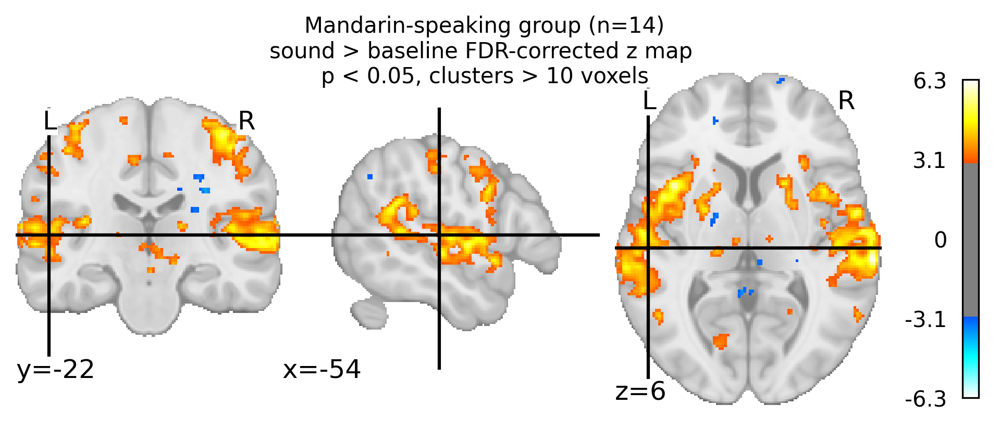

In [16]:
fig, ax = plt.subplots(figsize=(8,3), dpi=300)

plotting.plot_stat_map(
    thresholded_map, 
    threshold=zthresh,
    bg_img=mni152_template,
    black_bg=False,
    cut_coords=[-54, -22, 6],
    #display_mode='mosaic',
    #title=plot_title,
    axes=ax)
fig.suptitle(plot_title, fontsize=10);
print('The %s=%.3g threshold is %.3g' %(cluster_correct, alpha, zthresh))

Interactive viewer:

/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



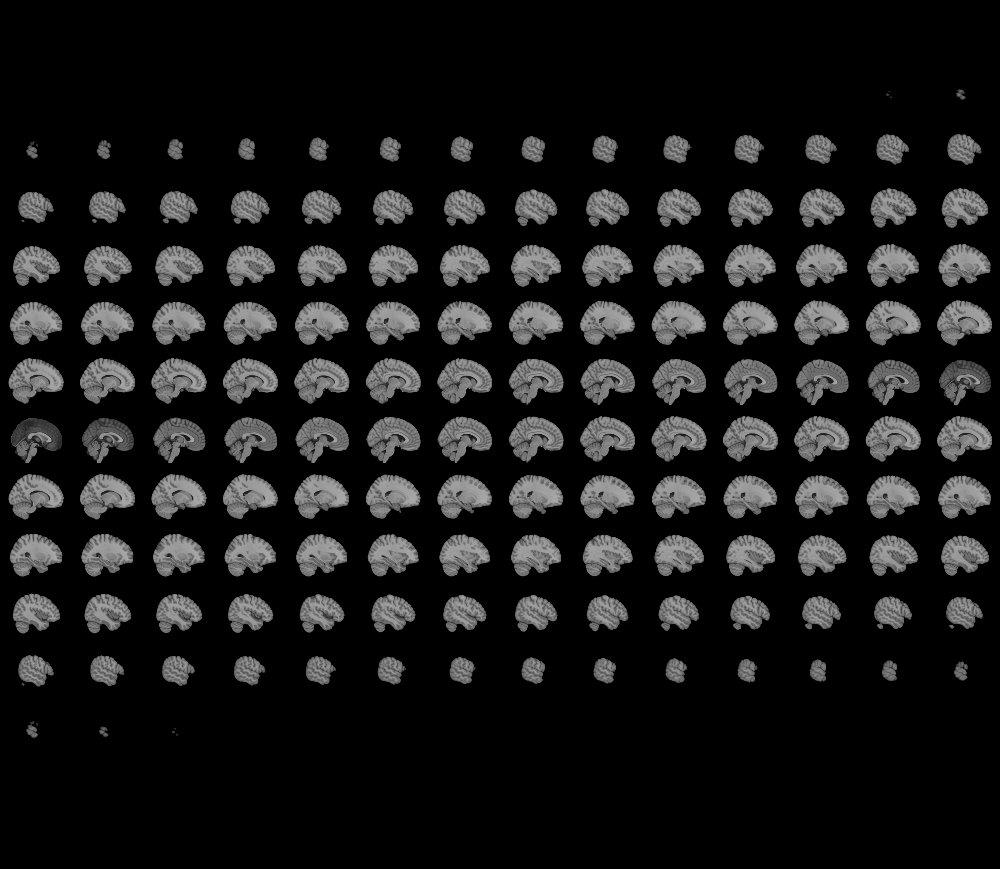
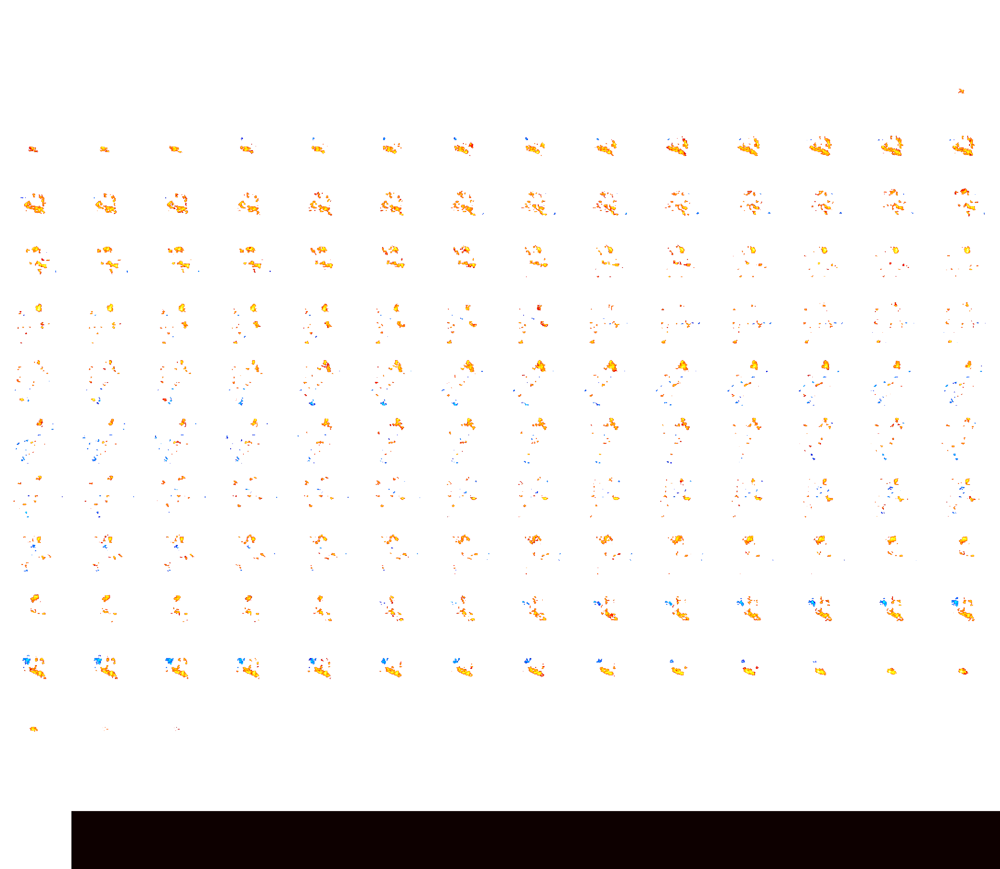

In [17]:
plotting.view_img(thresholded_map, 
                  threshold=zthresh, 
                  bg_img=mni152_template,
                  cut_coords=[-54, -22, 6],
                  title='Mand sound > baseline')

#### Surface plots:

In [ ]:
print(plot_title)
plotting.plot_img_on_surf(thresholded_map,
                          surf_mesh='fsaverage',
                          views=['lateral', 'medial'],
                          hemispheres=['left', 'right'],
                          inflate=True,
                          threshold=zthresh,
                          colorbar=True,)
plotting.show()

Mandarin-speaking group (n=14)
sound > baseline FDR-corrected z map 
p < 0.05, clusters > 10 voxels


#### High-res pial surface

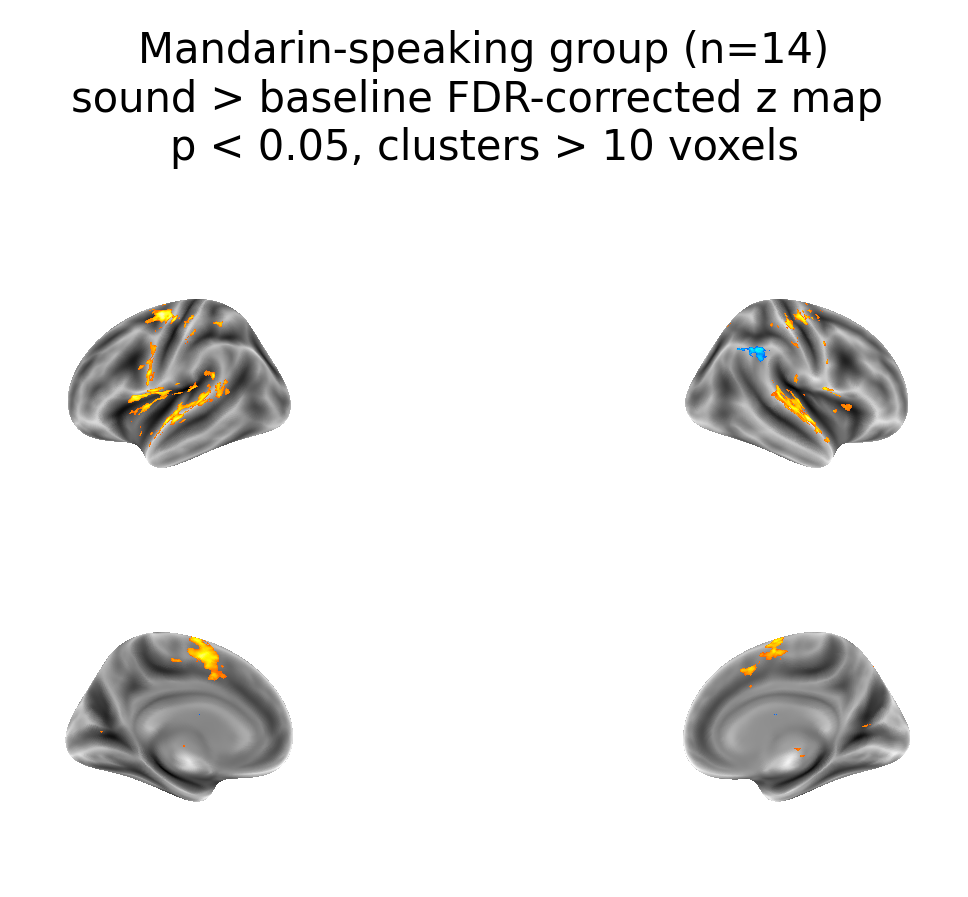

In [19]:
fig2, axes2 = plt.subplots(nrows=2, ncols=2, subplot_kw={"projection": "3d"}, figsize=(5,3), dpi=300)
fig2.suptitle(plot_title, fontsize=10);

texture_left = surface.vol_to_surf(thresholded_map, fsaverage.pial_left)
texture_right = surface.vol_to_surf(thresholded_map, fsaverage.pial_right)

# left hemisphere lateral view
plotting.plot_surf_stat_map(fsaverage.infl_left, texture_left, hemi='left',
                            #title='{} group – {} contrast'.format(group, contrast),
                            vmax=6,
                            colorbar=False,
                            threshold=zthresh, 
                            view='lateral',
                            bg_map=fsaverage.sulc_left, 
                            axes=axes2[0,0], 
                            fig=fig2
                            )

# right hemisphere lateral view
plotting.plot_surf_stat_map(fsaverage.infl_right, texture_right, hemi='right',
                            #title='{} group – {} contrast'.format(group, contrast),
                            #colorbar=True,
                            vmax=6,
                            colorbar=False,
                            threshold=zthresh, 
                            view='lateral',
                            bg_map=fsaverage.sulc_right, 
                            axes=axes2[0,1], 
                            fig=fig2
                            )

# left hemisphere medial view
plotting.plot_surf_stat_map(fsaverage.infl_left, texture_left, hemi='left',
                            #title='{} group – {} contrast'.format(group, contrast),
                            vmax=6,
                            colorbar=False,
                            threshold=zthresh, 
                            view='medial',
                            bg_map=fsaverage.sulc_left, 
                            axes=axes2[1,0], 
                            fig=fig2
                            )

# right hemisphere medial view
plotting.plot_surf_stat_map(fsaverage.infl_right, texture_right, hemi='right',
                            #title='{} group – {} contrast'.format(group, contrast),
                            #colorbar=True,
                            vmax=6,
                            colorbar=False,
                            threshold=zthresh, 
                            view='medial',
                            bg_map=fsaverage.sulc_right, 
                            axes=axes2[1,1], 
                            fig=fig2
                            )
fig2.tight_layout()
fig2.show()

#### High-res subcortical slices

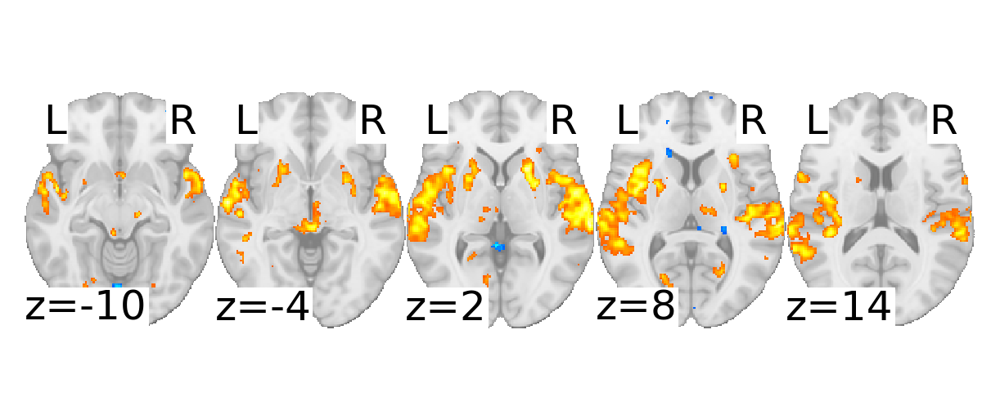

In [20]:
fig1, ax1 = plt.subplots(figsize=(5,2), dpi=300)
plotting.plot_stat_map(thresholded_map,
                       bg_img=mni152_template,
                       threshold=zthresh,
                       vmax=6,
                       cut_coords=[-10, -4, 2, 8, 14],
                       display_mode='z',
                       colorbar=False, 
                       draw_cross=False, 
                       black_bg=False,
                       axes=ax1)

### Non-Mandarin speaking group:

#### Using combined GLM, with contrast isolating non-Mandarin-speaking group

In [53]:
second_level_model = SecondLevelModel().fit(l1_fnames_groupdiff, design_matrix=design_mat_groupdiff)

z_map = second_level_model.compute_contrast(second_level_contrast=[0, 1], output_type='z_score')

In [54]:
# threshold the second-level stats image
alpha = 0.05
cthresh = 10
cluster_correct = 'fdr'

thresholded_map, zthresh = threshold_stats_img(
                            z_map,
                            alpha=alpha,
                            height_control=cluster_correct,
                            cluster_threshold=cthresh,
                            two_sided=True,
                        )

In [55]:
z_fpath   = os.path.join(group_out_dir,
                         'group-NMan_space-{}_contrast-{}_map-zstat.nii.gz'.format(space_label, contrast_label))
thr_fpath = os.path.join(group_out_dir,
                         'group-NMan_space-{}_contrast-{}_alpha-{}_correct-{}_cthresh-{}_map-zstat.nii.gz'.format(space_label, contrast_label, alpha, cluster_correct, cthresh))

nib.save(z_map, z_fpath)
nib.save(thresholded_map, thr_fpath)

In [23]:
plot_title = ('Non-Mandarin-speaking group (n=%d)\n'
              '%s > baseline FDR-corrected z map \n'
              'p < %.02f, clusters > %d voxels'%(len(sub_list_nman), contrast_label, alpha, cthresh))

The fdr=0.05 threshold is 2.99


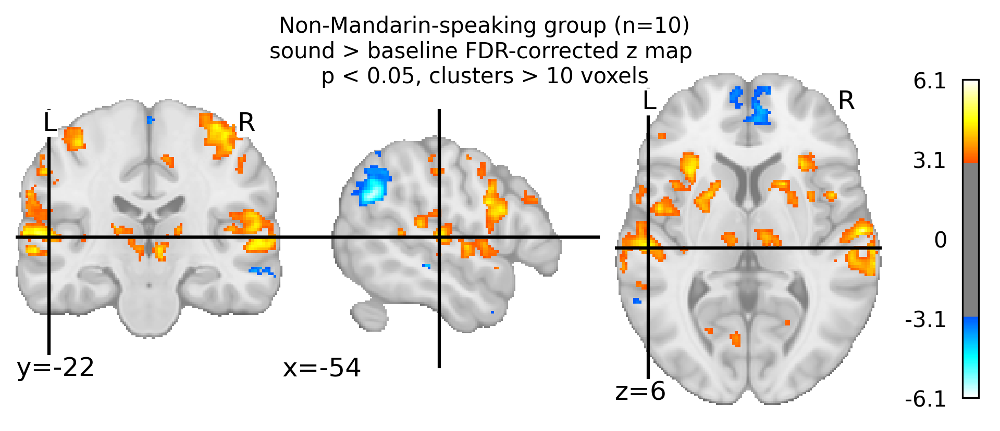

In [24]:
fig, ax = plt.subplots(figsize=(8,3), dpi=300)

plotting.plot_stat_map(
    thresholded_map, 
    threshold=zthresh,
    bg_img=mni152_template,
    black_bg=False,
    cut_coords=[-54, -22, 6],
    #display_mode='mosaic',
    #title=plot_title,
    axes=ax)
fig.suptitle(plot_title, fontsize=10);
print('The %s=%.3g threshold is %.3g' %(cluster_correct, alpha, zthresh))

Interactive viewer:

/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



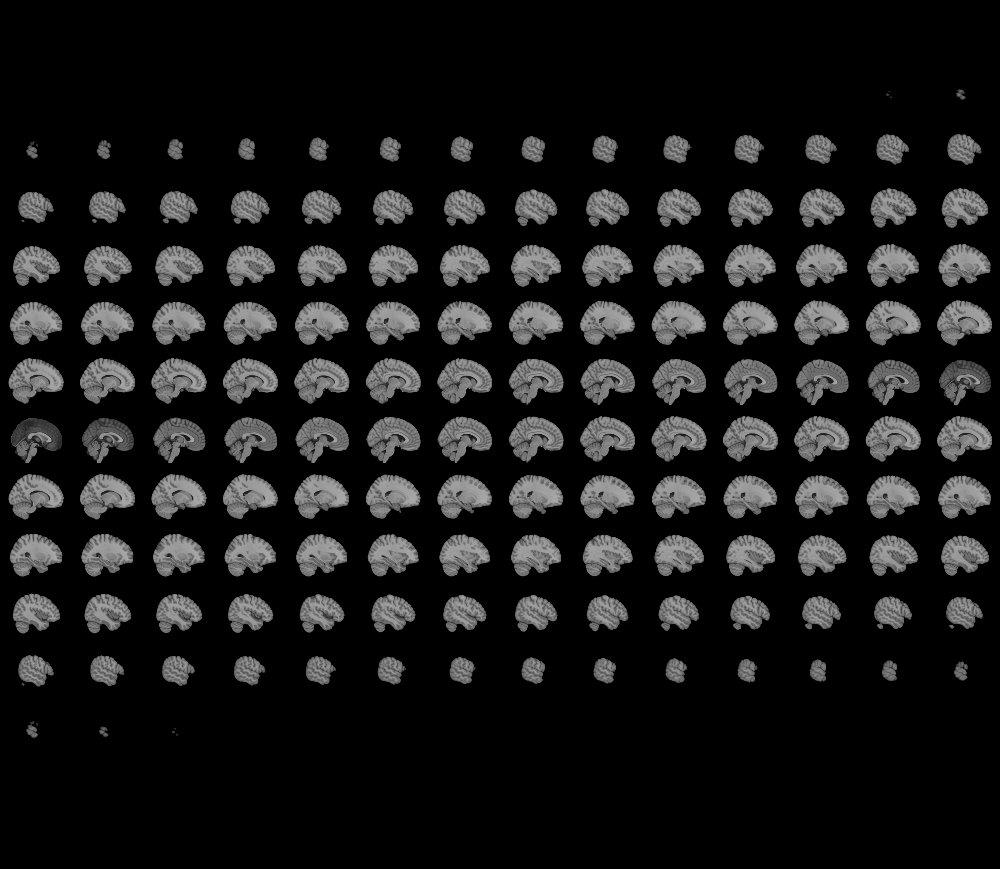
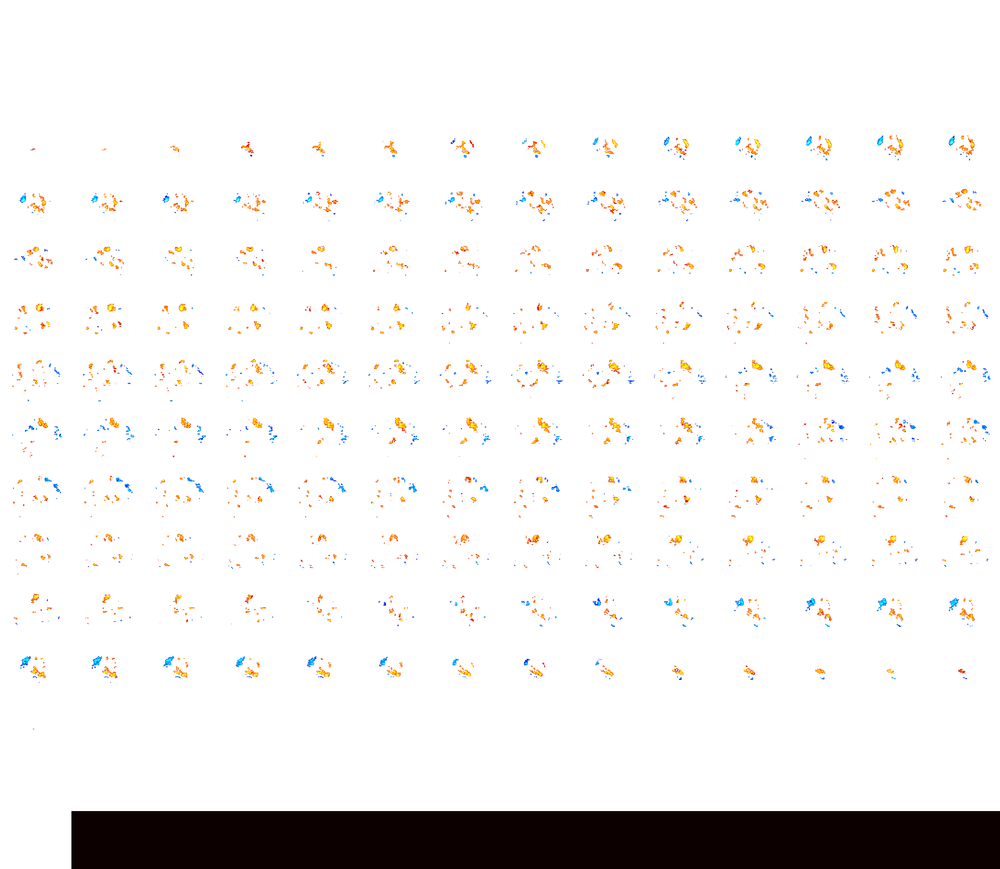

In [25]:
plotting.view_img(thresholded_map, 
                  threshold=zthresh, 
                  bg_img=mni152_template,
                  cut_coords=[-54, -22, 6],
                  title='NMan sound > baseline')

#### Surface plots:

Non-Mandarin-speaking group (n=10)
sound > baseline FDR-corrected z map 
p < 0.05, clusters > 10 voxels


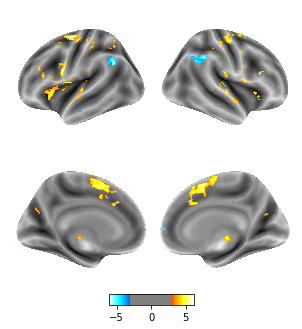

In [26]:
print(plot_title)
plotting.plot_img_on_surf(thresholded_map,
                          surf_mesh='fsaverage',
                          views=['lateral', 'medial'],
                          hemispheres=['left', 'right'],
                          inflate=True,
                          threshold=zthresh,
                          colorbar=True,)
plotting.show()

#### High-res pial surface

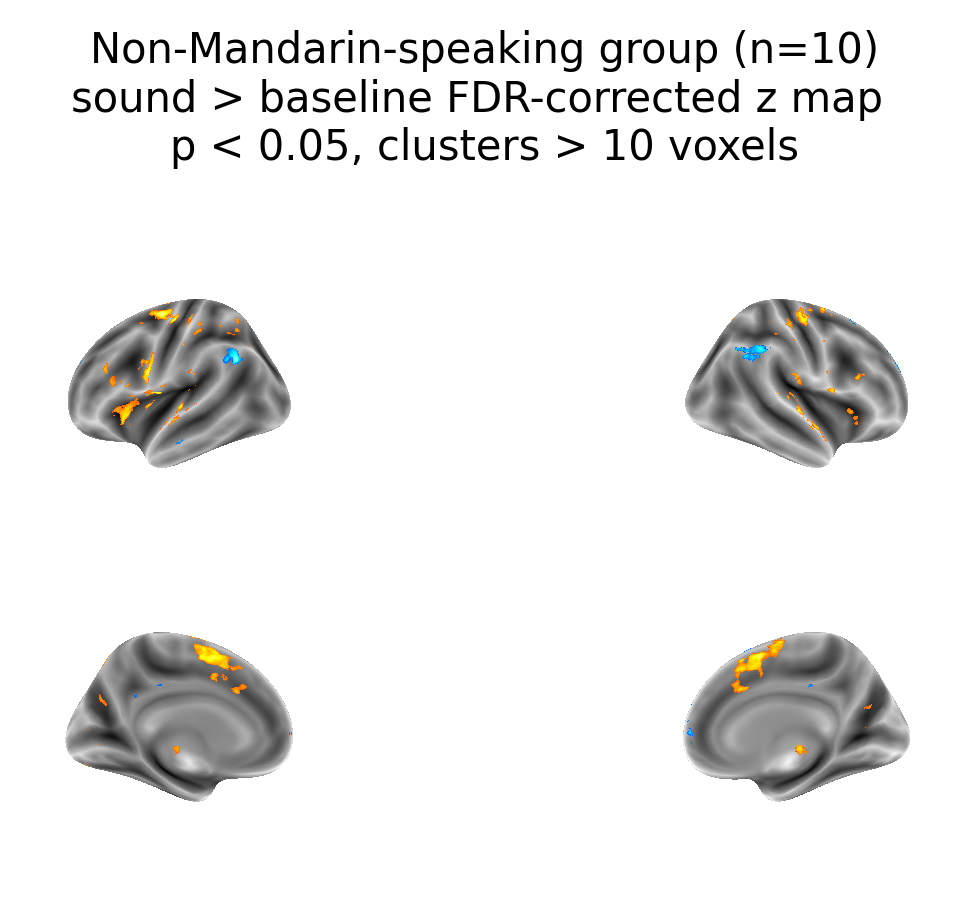

In [27]:
fig2, axes2 = plt.subplots(nrows=2, ncols=2, subplot_kw={"projection": "3d"}, figsize=(5,3), dpi=300)
fig2.suptitle(plot_title, fontsize=10)

texture_left = surface.vol_to_surf(thresholded_map, fsaverage.pial_left)
texture_right = surface.vol_to_surf(thresholded_map, fsaverage.pial_right)

# left hemisphere lateral view
plotting.plot_surf_stat_map(fsaverage.infl_left, texture_left, hemi='left',
                            #title='{} group – {} contrast'.format(group, contrast),
                            vmax=6,
                            colorbar=False,
                            threshold=zthresh, 
                            view='lateral',
                            bg_map=fsaverage.sulc_left, 
                            axes=axes2[0,0], 
                            fig=fig2
                            )

# right hemisphere lateral view
plotting.plot_surf_stat_map(fsaverage.infl_right, texture_right, hemi='right',
                            #title='{} group – {} contrast'.format(group, contrast),
                            #colorbar=True,
                            vmax=6,
                            colorbar=False,
                            threshold=zthresh, 
                            view='lateral',
                            bg_map=fsaverage.sulc_right, 
                            axes=axes2[0,1], 
                            fig=fig2
                            )

# left hemisphere medial view
plotting.plot_surf_stat_map(fsaverage.infl_left, texture_left, hemi='left',
                            #title='{} group – {} contrast'.format(group, contrast),
                            vmax=6,
                            colorbar=False,
                            threshold=zthresh, 
                            view='medial',
                            bg_map=fsaverage.sulc_left, 
                            axes=axes2[1,0], 
                            fig=fig2
                            )

# right hemisphere medial view
plotting.plot_surf_stat_map(fsaverage.infl_right, texture_right, hemi='right',
                            #title='{} group – {} contrast'.format(group, contrast),
                            #colorbar=True,
                            vmax=6,
                            colorbar=False,
                            threshold=zthresh, 
                            view='medial',
                            bg_map=fsaverage.sulc_right, 
                            axes=axes2[1,1], 
                            fig=fig2
                            )
fig2.tight_layout()
fig2.show()

#### High-res subcortical slices

Non-Mandarin-speaking group (n=10)
sound > baseline FDR-corrected z map 
p < 0.05, clusters > 10 voxels


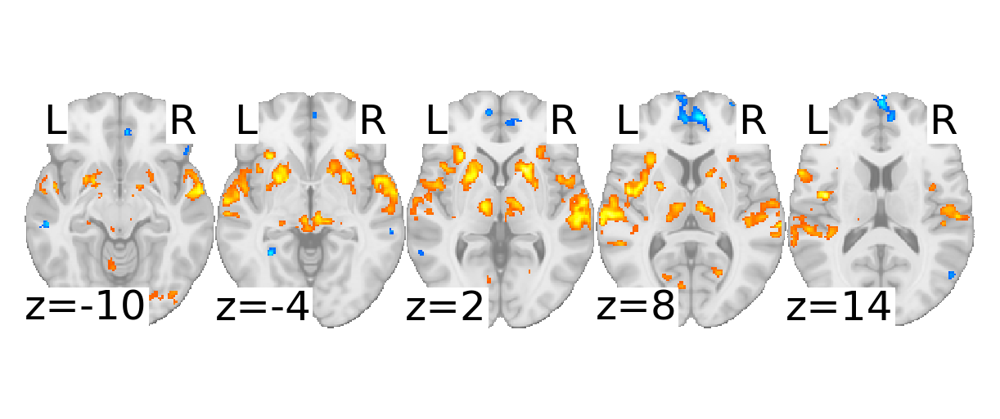

In [28]:
fig1, ax1 = plt.subplots(figsize=(5,2), dpi=300)
print(plot_title)
plotting.plot_stat_map(thresholded_map,
                       bg_img=mni152_template,
                       threshold=zthresh,
                       vmax=6,
                       cut_coords=[-10, -4, 2, 8, 14],
                       display_mode='z',
                       colorbar=False, 
                       draw_cross=False, 
                       black_bg=False,
                       axes=ax1)

### Group differences

In [56]:
second_level_model = SecondLevelModel().fit(l1_fnames_groupdiff, design_matrix=design_mat_groupdiff)

z_map = second_level_model.compute_contrast(second_level_contrast=[1, -1], output_type='z_score')

In [57]:
# threshold the second-level stats image
alpha = 0.05
cthresh = 10
cluster_correct = 'fdr'

thresholded_map, zthresh = threshold_stats_img(
                            z_map,
                            alpha=alpha,
                            height_control=cluster_correct,
                            cluster_threshold=cthresh,
                            two_sided=True,
                        )

/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.945860545741215. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "


In [58]:
z_fpath   = os.path.join(group_out_dir,
                         'group-Mand-vs-NMan_space-{}_contrast-{}_map-zstat.nii.gz'.format(space_label, contrast_label))
thr_fpath = os.path.join(group_out_dir,
                         'group-Mand-vs-NMan_space-{}_contrast-{}_alpha-{}_correct-{}_cthresh-{}_map-zstat.nii.gz'.format(space_label, contrast_label, alpha, cluster_correct, cthresh))

nib.save(z_map, z_fpath)
nib.save(thresholded_map, thr_fpath)

In [31]:
plot_title = ('Mand (n=%d) vs. NMan (n=%d) group differences\n'
              '%s > baseline FDR-corrected z map \n'
              'p < %.02f, clusters > %d voxels'%(len(sub_list_mand), len(sub_list_nman), 
                                                 contrast_label, alpha, cthresh))

/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


The fdr=0.05 threshold is inf


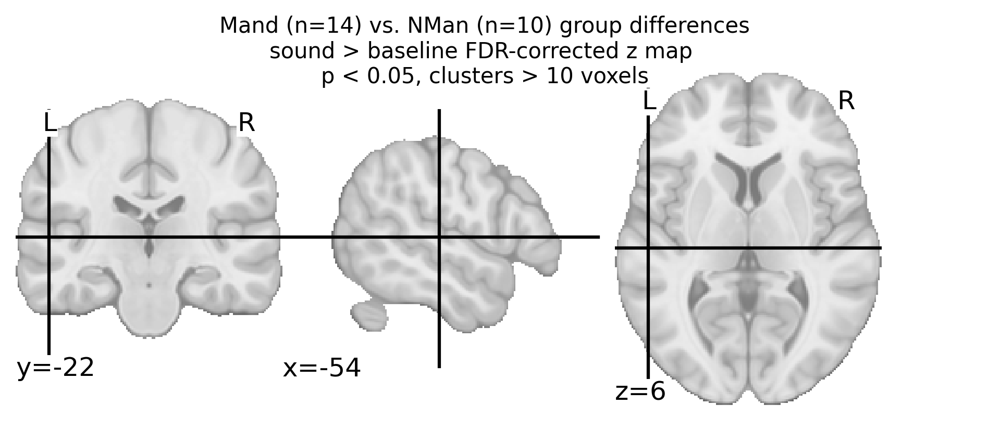

In [32]:
fig, ax = plt.subplots(figsize=(8,3), dpi=300)

plotting.plot_stat_map(
    thresholded_map, 
    threshold=zthresh,
    bg_img=mni152_template,
    black_bg=False,
    cut_coords=[-54, -22, 6],
    #display_mode='mosaic',
    #title=plot_title,
    axes=ax)
fig.suptitle(plot_title, fontsize=10);
print('The %s=%.3g threshold is %.3g' %(cluster_correct, alpha, zthresh))

Interactive viewer:

/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 0.0. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



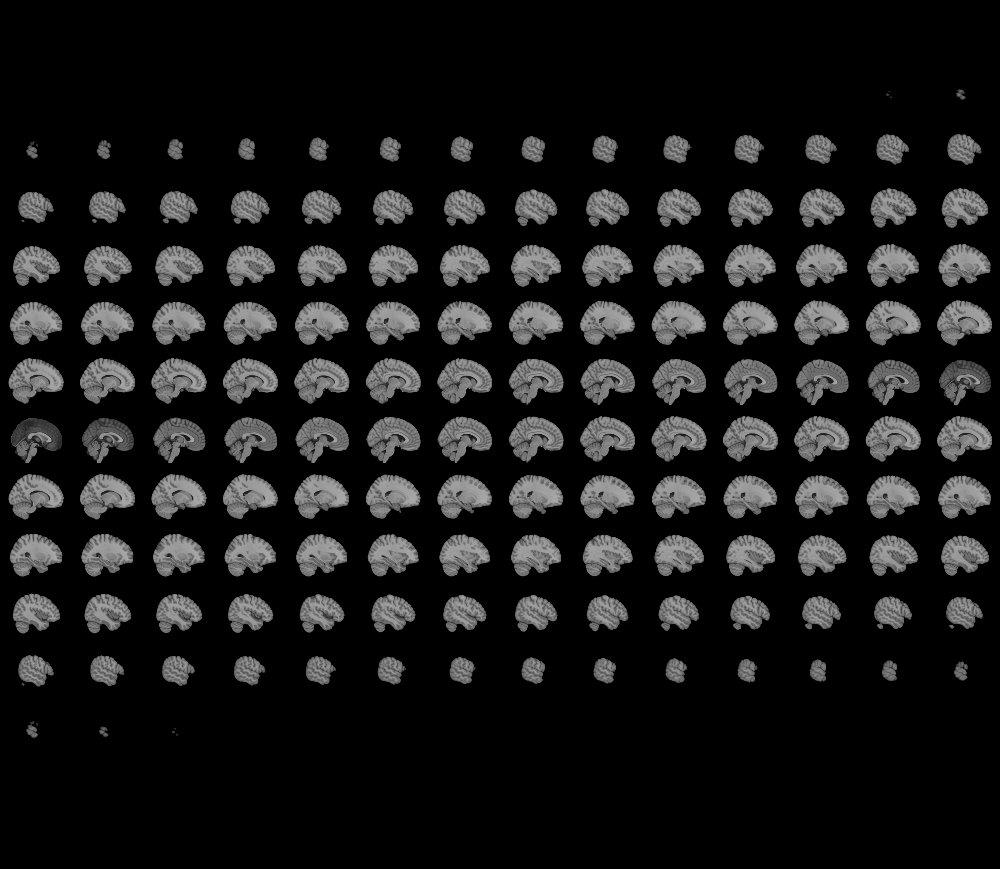
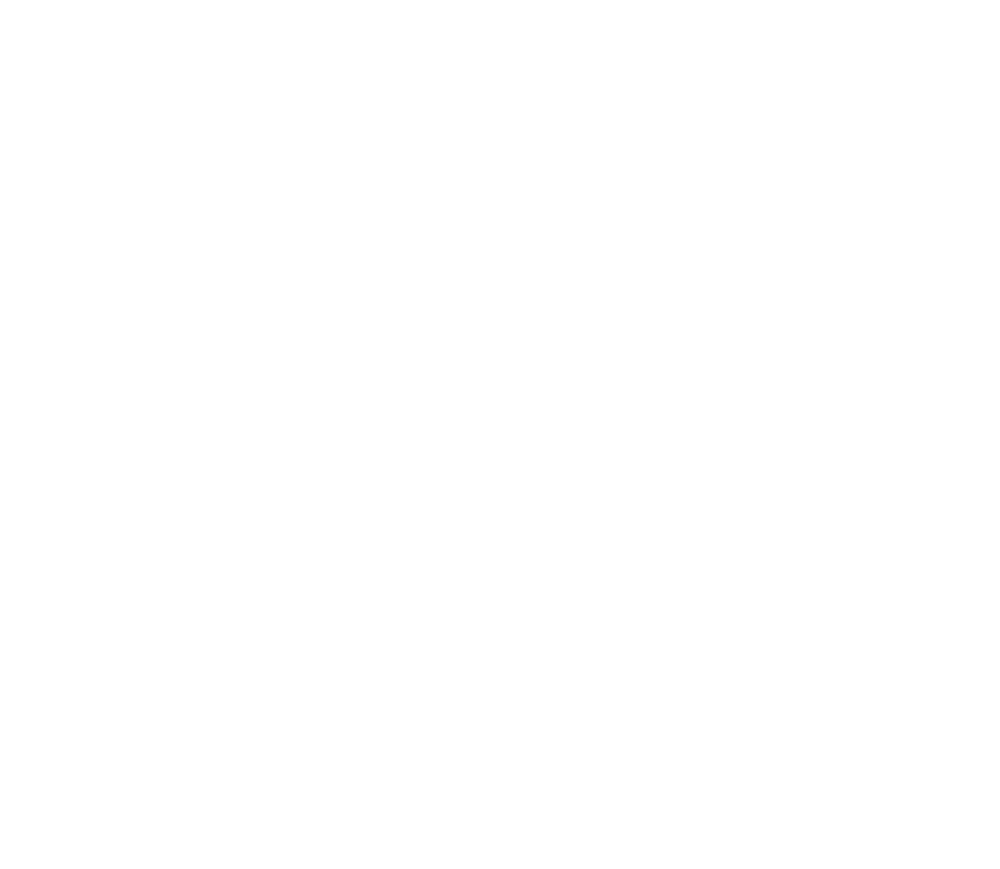

In [33]:
plotting.view_img(thresholded_map, 
                  threshold=zthresh, 
                  bg_img=mni152_template,
                  cut_coords=[-54, -22, 6],
                  title='Mand > NMan sound > baseline')

#### Surface plots:

Mand (n=14) vs. NMan (n=10) group differences
sound > baseline FDR-corrected z map 
p < 0.05, clusters > 10 voxels


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/plotting/surf_plotting.py:421: RuntimeWarning: invalid value encountered in true_divide
  data_copy /= (vmax - vmin)


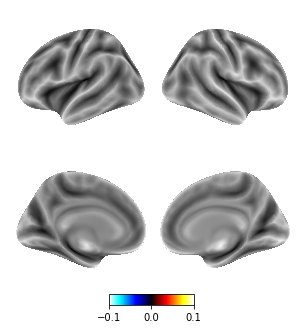

In [34]:
print(plot_title)
plotting.plot_img_on_surf(thresholded_map,
                          surf_mesh='fsaverage',
                          views=['lateral', 'medial'],
                          hemispheres=['left', 'right'],
                          inflate=True,
                          threshold=zthresh,
                          colorbar=True,)
plotting.show()

#### High-res pial surface

In [ ]:
fig2, axes2 = plt.subplots(nrows=2, ncols=2, subplot_kw={"projection": "3d"}, figsize=(5,3), dpi=300)
fig2.suptitle(plot_title, fontsize=10)

texture_left = surface.vol_to_surf(thresholded_map, fsaverage.pial_left)
texture_right = surface.vol_to_surf(thresholded_map, fsaverage.pial_right)

# left hemisphere lateral view
plotting.plot_surf_stat_map(fsaverage.infl_left, texture_left, hemi='left',
                            #title='{} group – {} contrast'.format(group, contrast),
                            vmax=6,
                            colorbar=False,
                            threshold=zthresh, 
                            view='lateral',
                            bg_map=fsaverage.sulc_left, 
                            axes=axes2[0,0], 
                            fig=fig2
                            )

# right hemisphere lateral view
plotting.plot_surf_stat_map(fsaverage.infl_right, texture_right, hemi='right',
                            #title='{} group – {} contrast'.format(group, contrast),
                            #colorbar=True,
                            vmax=6,
                            colorbar=False,
                            threshold=zthresh, 
                            view='lateral',
                            bg_map=fsaverage.sulc_right, 
                            axes=axes2[0,1], 
                            fig=fig2
                            )

# left hemisphere medial view
plotting.plot_surf_stat_map(fsaverage.infl_left, texture_left, hemi='left',
                            #title='{} group – {} contrast'.format(group, contrast),
                            vmax=6,
                            colorbar=False,
                            threshold=zthresh, 
                            view='medial',
                            bg_map=fsaverage.sulc_left, 
                            axes=axes2[1,0], 
                            fig=fig2
                            )

# right hemisphere medial view
plotting.plot_surf_stat_map(fsaverage.infl_right, texture_right, hemi='right',
                            #title='{} group – {} contrast'.format(group, contrast),
                            #colorbar=True,
                            vmax=6,
                            colorbar=False,
                            threshold=zthresh, 
                            view='medial',
                            bg_map=fsaverage.sulc_right, 
                            axes=axes2[1,1], 
                            fig=fig2
                            )
fig2.tight_layout()
fig2.show()

#### High-res subcortical slices

In [ ]:
fig1, ax1 = plt.subplots(figsize=(5,2), dpi=300)
print(plot_title)
plotting.plot_stat_map(thresholded_map,
                       bg_img=mni152_template,
                       threshold=zthresh,
                       vmax=6,
                       cut_coords=[-10, -4, 2, 8, 14],
                       display_mode='z',
                       colorbar=False, 
                       draw_cross=False, 
                       black_bg=False,
                       axes=ax1)

## All participants

In [59]:
from nilearn.glm.second_level import SecondLevelModel
second_level_model = SecondLevelModel().fit(l1_fnames_groupdiff, design_matrix=design_mat_groupdiff)

z_map = second_level_model.compute_contrast(second_level_contrast=[1, 1], output_type='z_score')


In [60]:
# threshold the second-level stats image
alpha = 0.05
cthresh = 10
cluster_correct = 'fdr'

thresholded_map, zthresh = threshold_stats_img(
                            z_map,
                            alpha=alpha,
                            height_control=cluster_correct,
                            cluster_threshold=cthresh,
                            two_sided=True,
                        )

In [61]:
z_fpath   = os.path.join(group_out_dir,
                         'group-all_space-{}_contrast-{}_map-zstat.nii.gz'.format(space_label, contrast_label))
thr_fpath = os.path.join(group_out_dir,
                         'group-all_space-{}_contrast-{}_alpha-{}_correct-{}_cthresh-{}_map-zstat.nii.gz'.format(space_label, contrast_label, alpha, cluster_correct, cthresh))

nib.save(z_map, z_fpath)
nib.save(thresholded_map, thr_fpath)

In [42]:
plot_title = ('All participants (n=%d)\n'
              '%s > baseline FDR-corrected z map \n'
              'p < %.02f, clusters > %d voxels'%(len(l1_fnames_groupdiff), 
                                                 contrast_label, alpha, cthresh))

The fdr=0.05 threshold is 2.75


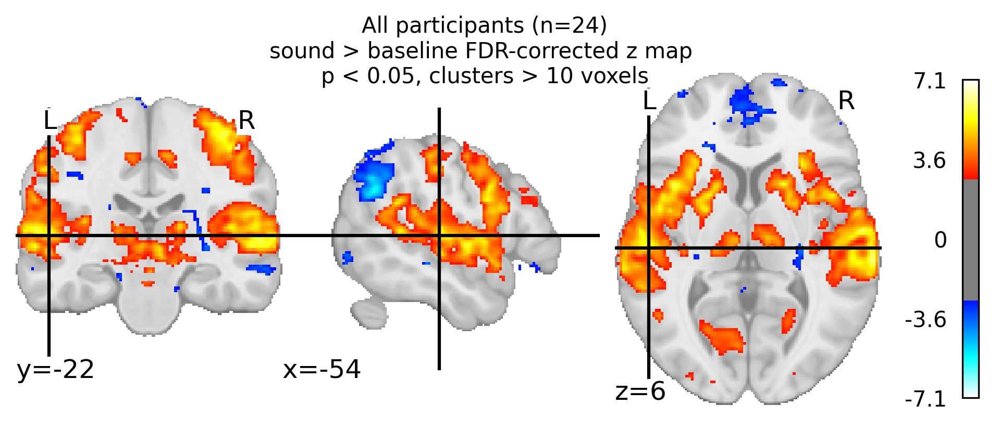

In [43]:
fig, ax = plt.subplots(figsize=(8,3), dpi=300)

plotting.plot_stat_map(
    thresholded_map, 
    threshold=zthresh,
    bg_img=mni152_template,
    black_bg=False,
    cut_coords=[-54, -22, 6],
    #display_mode='mosaic',
    #title=plot_title,
    axes=ax)
fig.suptitle(plot_title, fontsize=10);
print('The %s=%.3g threshold is %.3g' %(cluster_correct, alpha, zthresh))

Interactive viewer:

/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



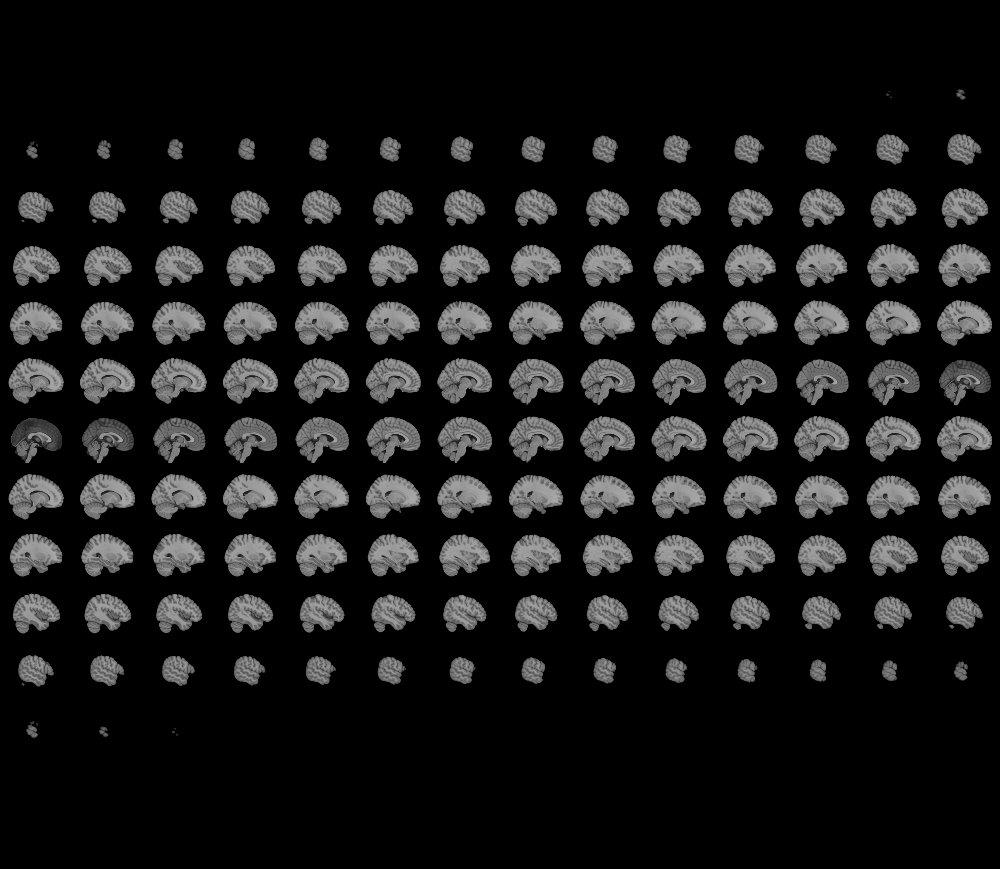
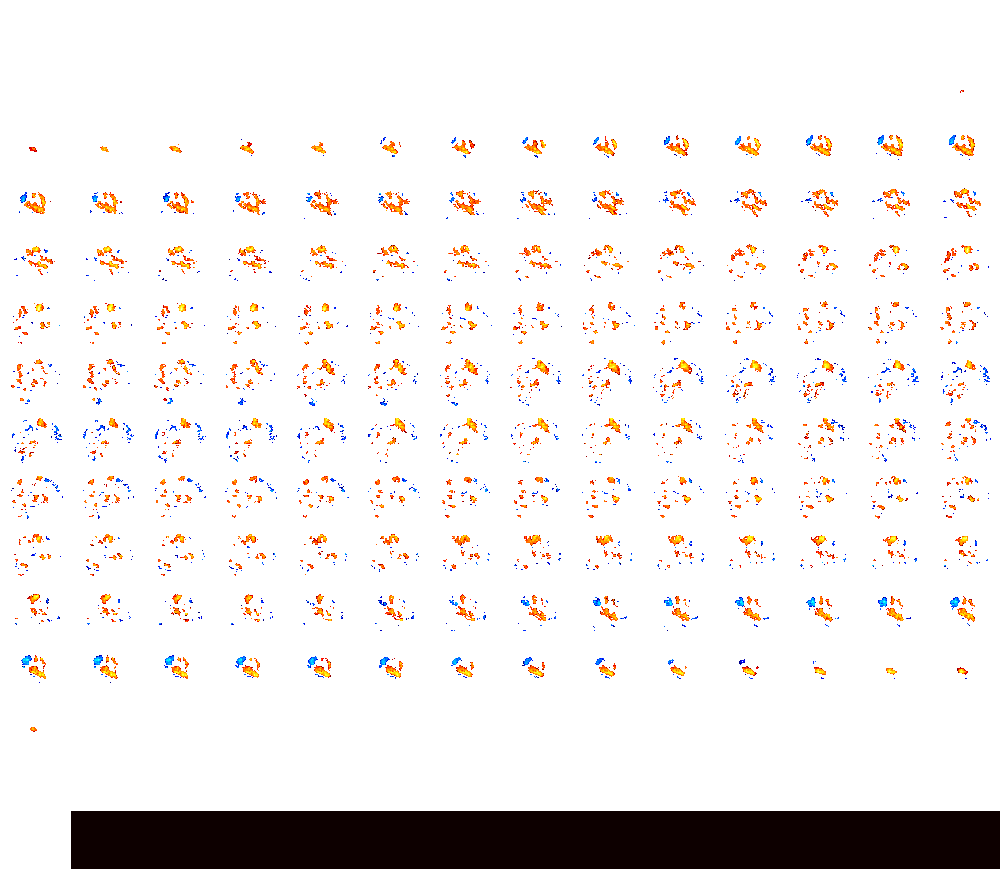

In [44]:
plotting.view_img(thresholded_map, 
                  threshold=zthresh, 
                  bg_img=mni152_template,
                  cut_coords=[-54, -22, 6],
                  title='Mand > NMan sound > baseline')

#### Surface plots:

All participants (n=24)
sound > baseline FDR-corrected z map 
p < 0.05, clusters > 10 voxels


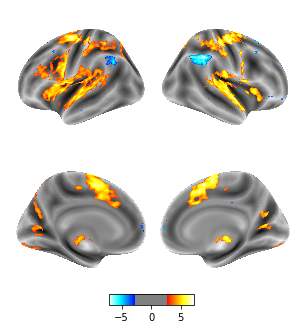

In [45]:
print(plot_title)
plotting.plot_img_on_surf(thresholded_map,
                          surf_mesh='fsaverage',
                          views=['lateral', 'medial'],
                          hemispheres=['left', 'right'],
                          inflate=True,
                          threshold=zthresh,
                          colorbar=True,)
plotting.show()

#### High-res pial surface

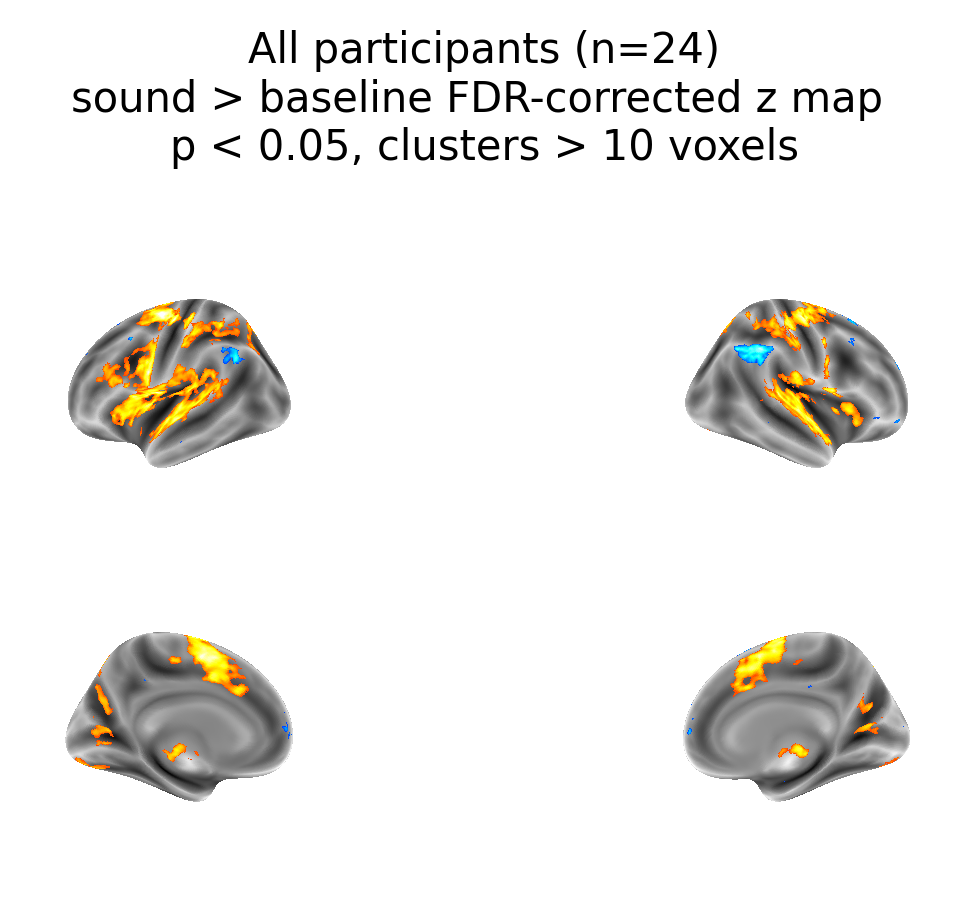

In [46]:
fig2, axes2 = plt.subplots(nrows=2, ncols=2, subplot_kw={"projection": "3d"}, figsize=(5,3), dpi=300)
fig2.suptitle(plot_title, fontsize=10)

texture_left = surface.vol_to_surf(thresholded_map, fsaverage.pial_left)
texture_right = surface.vol_to_surf(thresholded_map, fsaverage.pial_right)

# left hemisphere lateral view
plotting.plot_surf_stat_map(fsaverage.infl_left, texture_left, hemi='left',
                            #title='{} group – {} contrast'.format(group, contrast),
                            vmax=6,
                            colorbar=False,
                            threshold=zthresh, 
                            view='lateral',
                            bg_map=fsaverage.sulc_left, 
                            axes=axes2[0,0], 
                            fig=fig2
                            )

# right hemisphere lateral view
plotting.plot_surf_stat_map(fsaverage.infl_right, texture_right, hemi='right',
                            #title='{} group – {} contrast'.format(group, contrast),
                            #colorbar=True,
                            vmax=6,
                            colorbar=False,
                            threshold=zthresh, 
                            view='lateral',
                            bg_map=fsaverage.sulc_right, 
                            axes=axes2[0,1], 
                            fig=fig2
                            )

# left hemisphere medial view
plotting.plot_surf_stat_map(fsaverage.infl_left, texture_left, hemi='left',
                            #title='{} group – {} contrast'.format(group, contrast),
                            vmax=6,
                            colorbar=False,
                            threshold=zthresh, 
                            view='medial',
                            bg_map=fsaverage.sulc_left, 
                            axes=axes2[1,0], 
                            fig=fig2
                            )

# right hemisphere medial view
plotting.plot_surf_stat_map(fsaverage.infl_right, texture_right, hemi='right',
                            #title='{} group – {} contrast'.format(group, contrast),
                            #colorbar=True,
                            vmax=6,
                            colorbar=False,
                            threshold=zthresh, 
                            view='medial',
                            bg_map=fsaverage.sulc_right, 
                            axes=axes2[1,1], 
                            fig=fig2
                            )
fig2.tight_layout()
fig2.show()

#### High-res subcortical slices

All participants (n=24)
sound > baseline FDR-corrected z map 
p < 0.05, clusters > 10 voxels


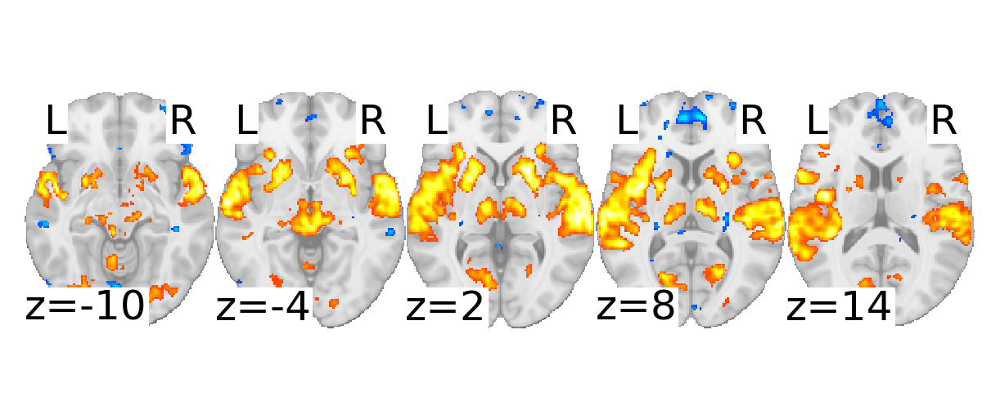

In [47]:
fig1, ax1 = plt.subplots(figsize=(5,2), dpi=300)
print(plot_title)
plotting.plot_stat_map(thresholded_map,
                       bg_img=mni152_template,
                       threshold=zthresh,
                       vmax=6,
                       cut_coords=[-10, -4, 2, 8, 14],
                       display_mode='z',
                       colorbar=False, 
                       draw_cross=False, 
                       black_bg=False,
                       axes=ax1)

# WIP (incomplete) 

### Permutation tests

In [43]:
from nilearn.glm.second_level import non_parametric_inference

In [ ]:
contrast_map_filenames = 

In [ ]:
log_pvals_permuted_ols_unmasked = \
    non_parametric_inference(contrast_map_filenames,
                             design_matrix=design_mat_groupdiff,
                             n_perm=1000,
                             n_jobs=1)